In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.style.use("fivethirtyeight")
mpl.rcParams["figure.figsize"] = (15, 8)
mpl.rcParams["figure.dpi"] = 50
mpl.rcParams["lines.linewidth"] = 2
mpl.rcParams["font.size"] = 12
mpl.rcParams["figure.titlesize"] = 25



In [2]:
# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------

df = pd.read_pickle("../data/interim/01_data_resampled.pkl")

df.query('category == "medium"').query('label == "bench"').query('participant == "E"').head(3)

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-19 17:12:14.400,0.0510,0.972000,-0.0700,-0.8660,-0.6464,-0.3292,E,bench,medium,64
2019-01-19 17:12:14.600,0.0460,0.970333,-0.0720,-0.2804,-2.4026,0.7562,E,bench,medium,64
2019-01-19 17:12:14.800,0.0515,0.980500,-0.0625,-0.5002,-2.0852,0.3414,E,bench,medium,64


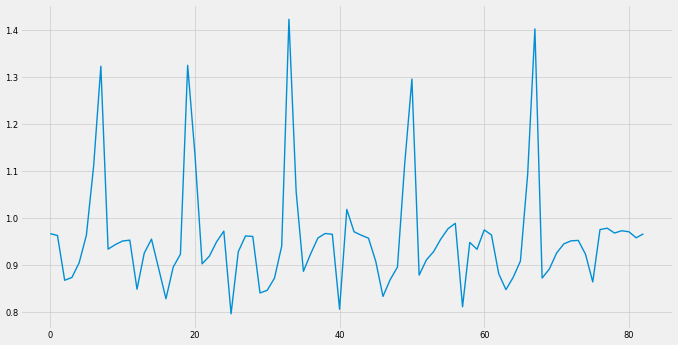

In [3]:
# --------------------------------------------------------------
# Plot single columns
# --------------------------------------------------------------

# Plotting individual sets
setted = 1
feature = "acc_y"

set_df = df[df["set"] == setted]["acc_y"]

# Reseting the index eliminate the datetime
plt.plot(set_df.reset_index(drop=True));

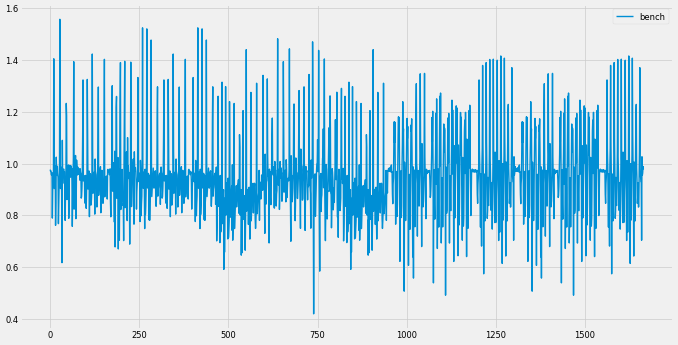

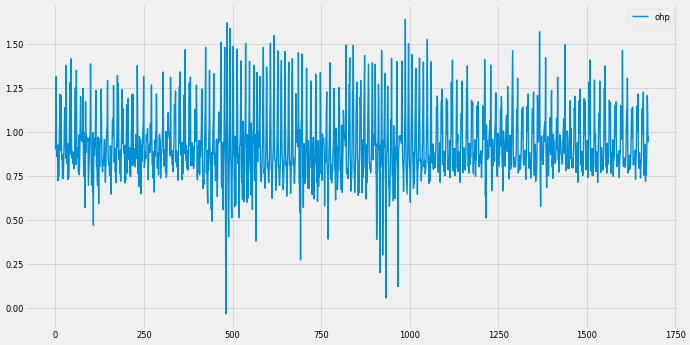

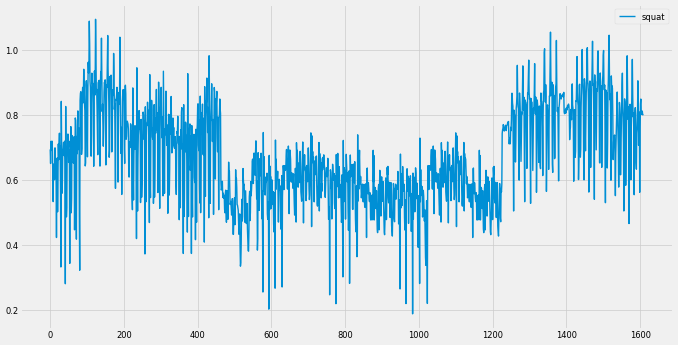

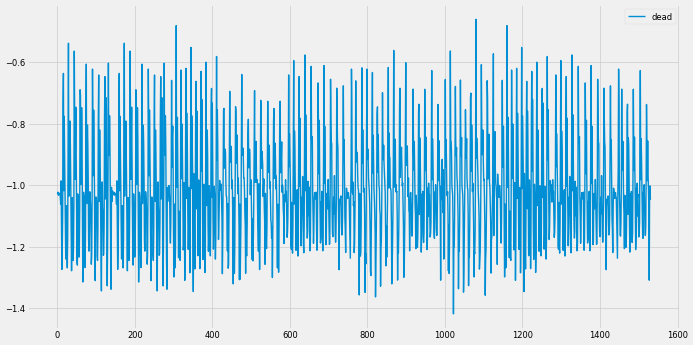

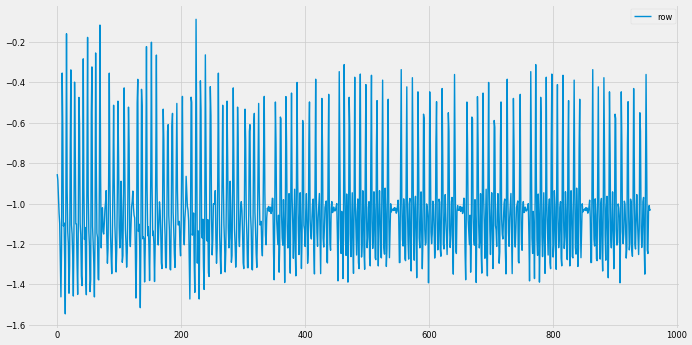

...

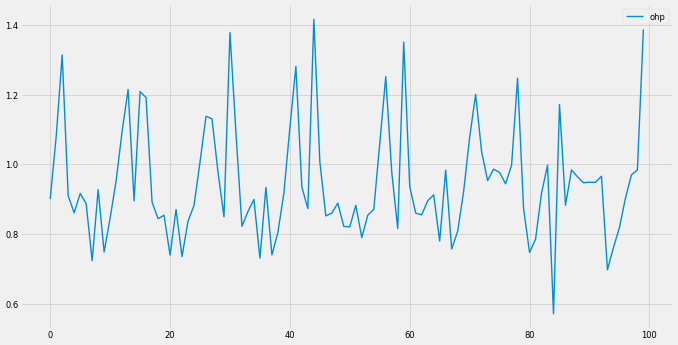

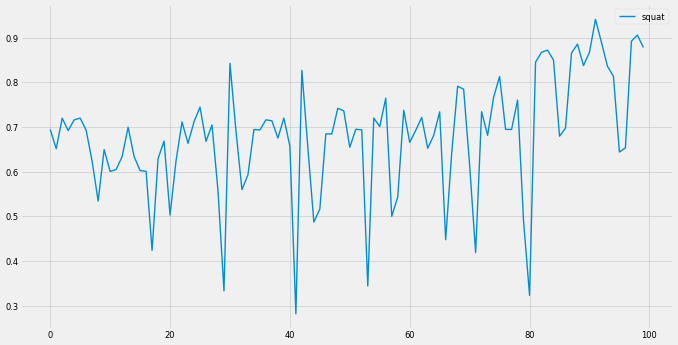

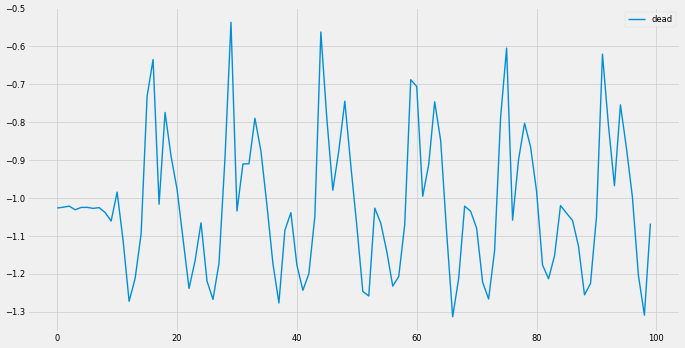

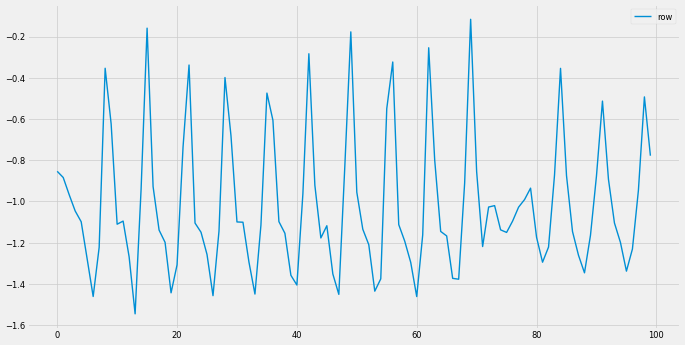

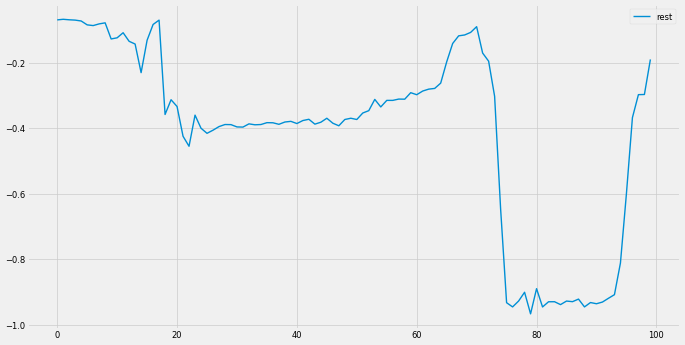

In [4]:
# --------------------------------------------------------------
# Plot all exercises
# --------------------------------------------------------------

feature = "acc_y"

# Individual exercises
for label in df["label"].unique():
    subset = df[df["label"] == label]
    fig, ax = plt.subplots()
    ax.plot(subset[feature].reset_index(drop=True), label=label)
    plt.legend()
    plt.show()

# Plotting fist 100 rows
for label in df["label"].unique():
    subset = df[df["label"] == label]
    fig, ax = plt.subplots()
    ax.plot(subset[:100][feature].reset_index(drop=True), label=label)
    plt.legend()
    plt.show()

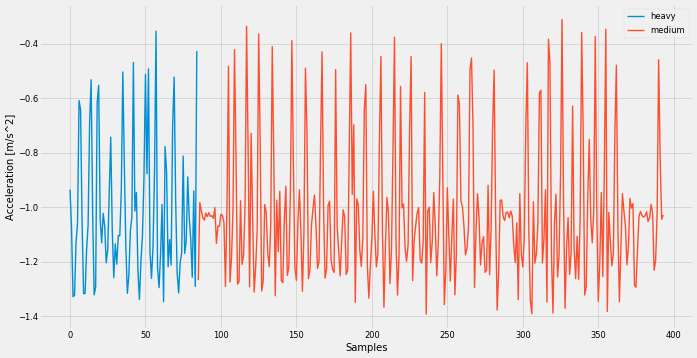

In [5]:
# --------------------------------------------------------------
# Compare medium vs. heavy sets
# --------------------------------------------------------------

label = "row"
sensor = "acc_y"
participant = "E"

category_df = (
    df.query(f'label == "{label}"')
    .query(f'participant == "{participant}"')
    .sort_values("category")
    .reset_index()
)


fig, ax = plt.subplots()
category_df.groupby(["category"])[sensor].plot()
ax.set_xlabel("Samples")
ax.set_ylabel("Acceleration [m/s^2]")
plt.legend()
plt.show()


In [6]:
# --------------------------------------------------------------
# Turn into afunction (plot_category_data)
# --------------------------------------------------------------

def plot_category_data(
    df: pd.DataFrame, label: str, sensor: str, participant: str
) -> None:
    """
    Plot category (medium and heavy sets) data for a specific label, sensor, and participant.

    Args:
        df (pd.DataFrame): Input DataFrame containing the data.
        label (str): Label to filter the data.
        sensor (str): Sensor to plot data for.
        participant (str): Participant to filter the data.

    Returns:
        None
    """

    category_df = (
        df.query(f'label == "{label}"')
        .query(f'participant == "{participant}"')
        .sort_values("category")
        .reset_index()
    )

    fig, ax = plt.subplots()
    category_df.groupby(["category"])[sensor].plot()
    ax.set_xlabel("Samples")
    ax.set_ylabel(f"{sensor.capitalize()} [m/s^2]")
    plt.title(f"label: {label} \nparticipant: {participant}")
    plt.legend()
    plt.show()

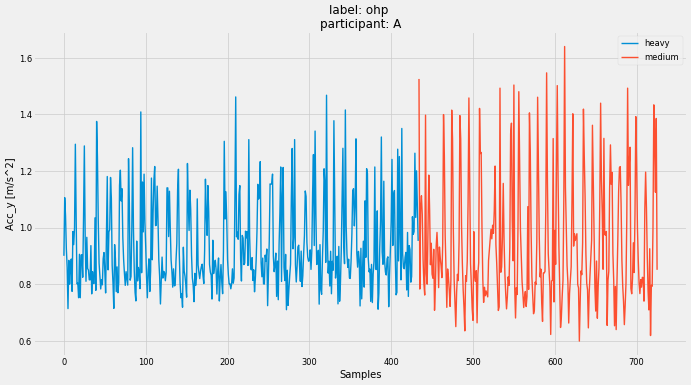

In [7]:
label = "ohp"
sensor = "acc_y"
participant = "A"

plot_category_data(df, label, sensor, participant)

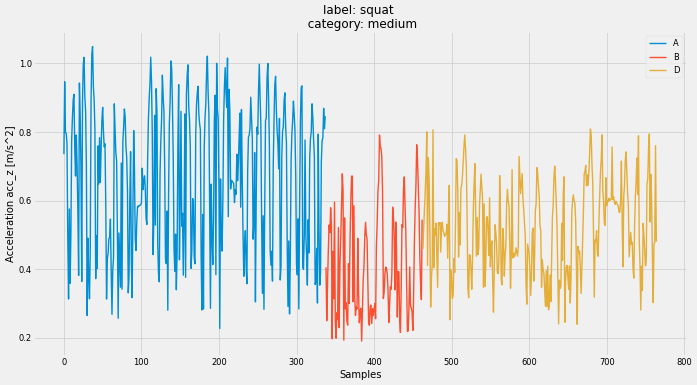

In [8]:
# --------------------------------------------------------------
# Compare participants
# --------------------------------------------------------------

label = "squat"
sensor = "acc_z"
category = "medium"

participant_df = (
    df.query(f'label == "{label}"')
    .sort_values(["participant"])
    .query(f'category == "{category}"')
    .reset_index()
)

fig, ax = plt.subplots()
participant_df.groupby(["participant"])[sensor].plot()
plt.title(label)
ax.set_xlabel("Samples")
ax.set_ylabel(f"Acceleration {sensor} [m/s^2]")
plt.title(f"label: {label} \n category: {category}")
plt.legend();

In [9]:
# --------------------------------------------------------------
# Turn into afunction (plot_compare_participants)
# --------------------------------------------------------------

def plot_compare_participants(
    df: pd.DataFrame, label: str, sensor: str, category: str
) -> None:
    """
    Plot participant data for a specific label, sensor, and category.

    Args:
        df (pd.DataFrame): Input DataFrame containing the data.
        label (str): Label to filter the data.
        sensor (str): Sensor to plot data for.
        category (str): Category to filter the data.

    Returns:
        None
    """

    participant_df = (
        df.query(f'label == "{label}"')
        .sort_values(["participant"])
        .query(f'category == "{category}"')
        .reset_index()
    )

    fig, ax = plt.subplots()
    participant_df.groupby(["participant"])[sensor].plot()
    plt.title(f"label: {label} \n category: {category}")
    ax.set_xlabel("Samples")
    ax.set_ylabel(f"Acceleration {sensor} [m/s^2]")
    plt.legend()
    plt.show()


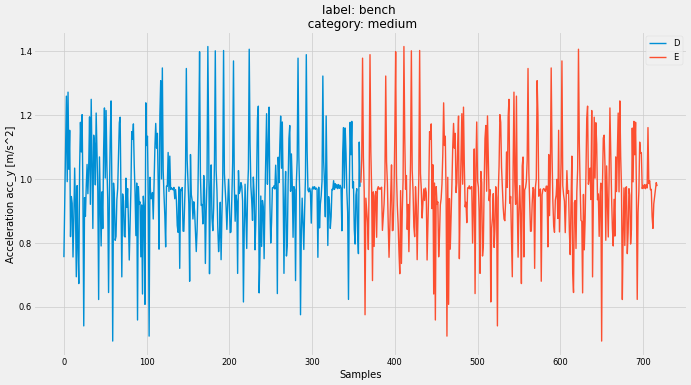

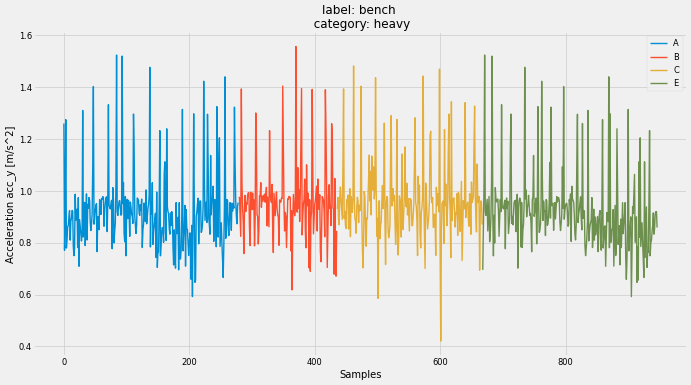

In [10]:
label = "bench"
sensor = "acc_y"
categories = ["medium", "heavy"]

for category in categories:
    plot_compare_participants(df, label, sensor, category)

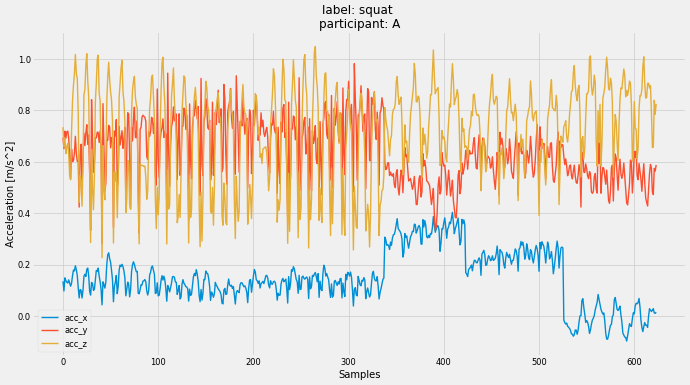

In [11]:
# --------------------------------------------------------------
# Plot multiple axis (x, y, z)
# --------------------------------------------------------------
label = "squat"
participant = "A"

all_axis_df = (
    df.query(f'label == "{label}"')
    .query(f'participant == "{participant}"')
    .reset_index()
)

fig, ax = plt.subplots()
all_axis_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax)
plt.title(f"label: {label} \nparticipant: {participant}")
ax.set_xlabel("Samples")
ax.set_ylabel("Acceleration [m/s^2]")
plt.legend()
plt.show()

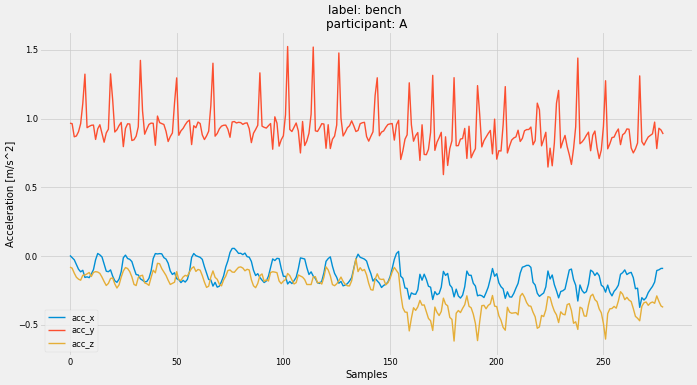

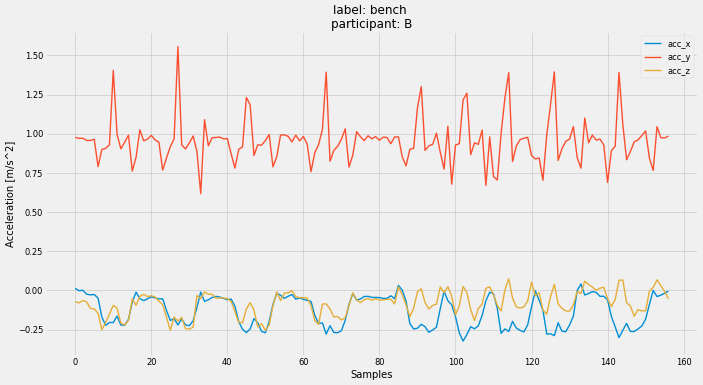

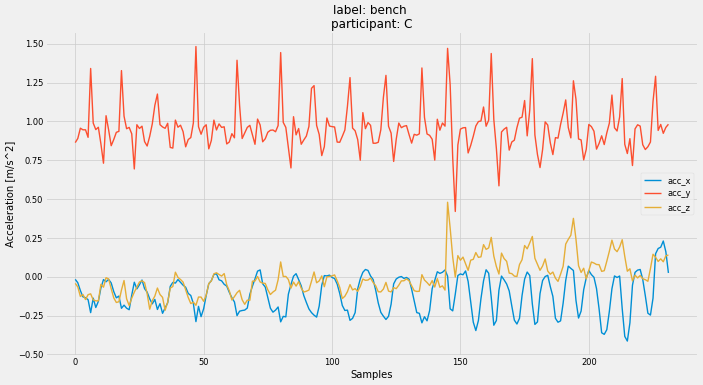

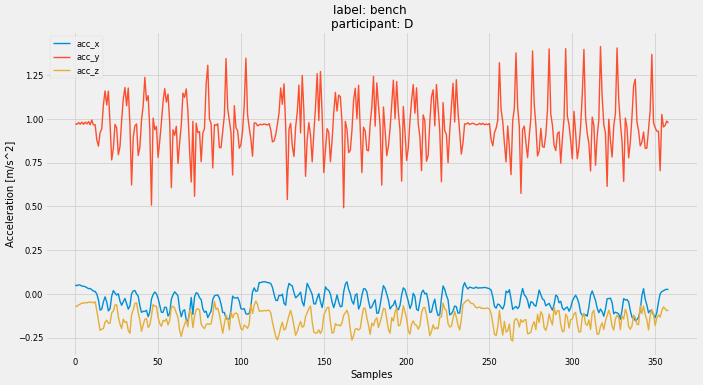

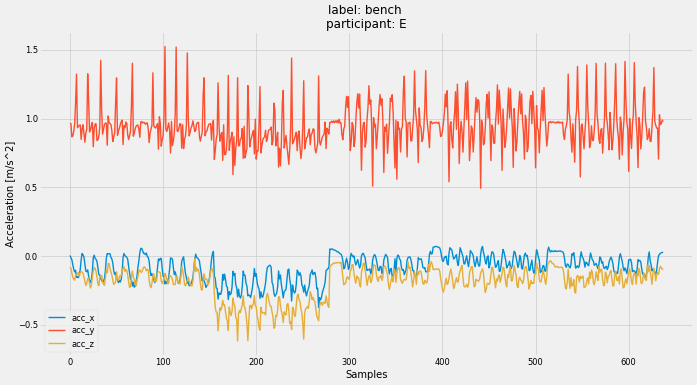

...

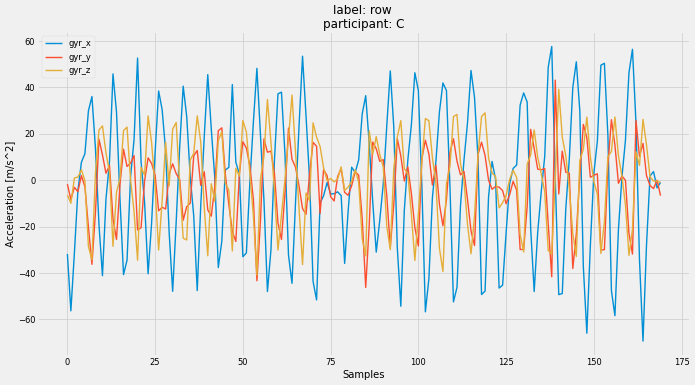

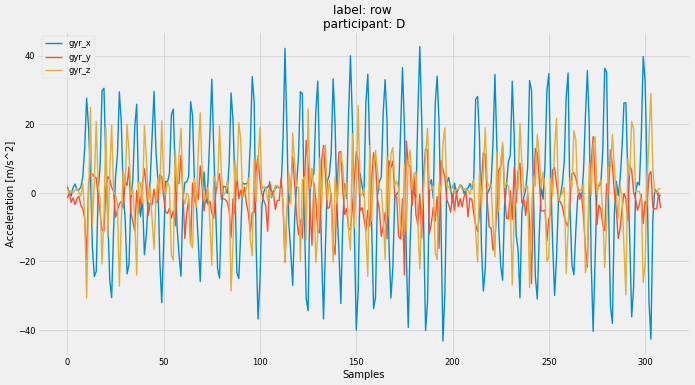

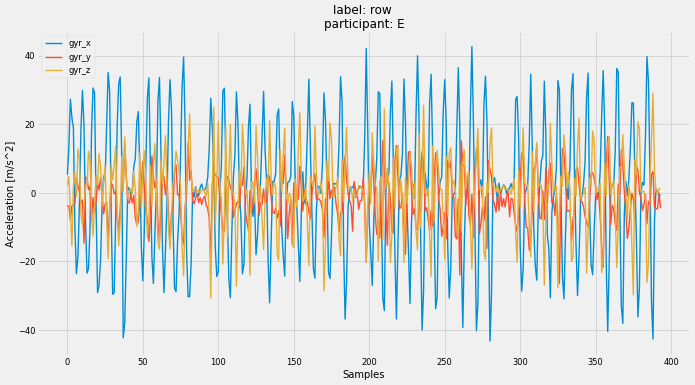

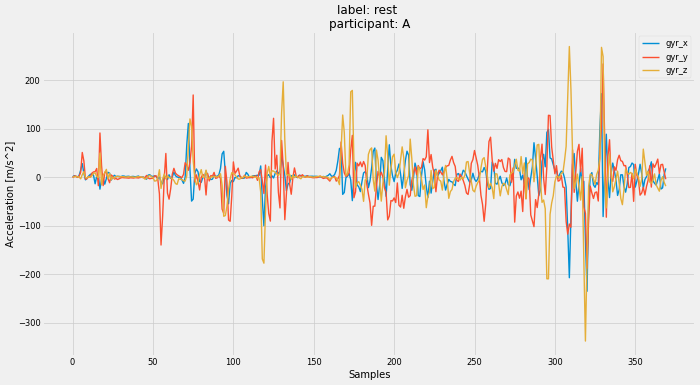

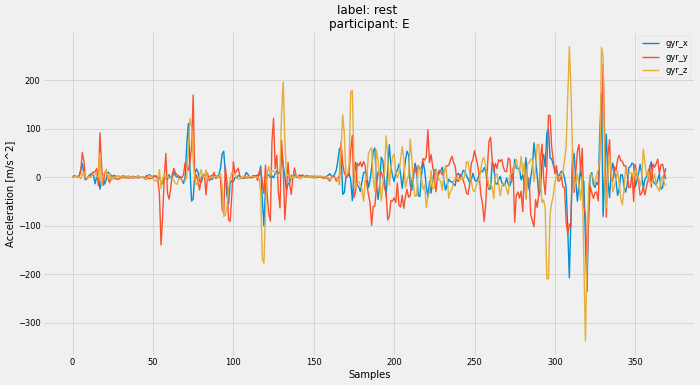

In [12]:
# --------------------------------------------------------------
# Create a loop to plot all combinations per sensor
# --------------------------------------------------------------

labels = df["label"].unique()
participants = df["participant"].unique()
participants.sort()

# Looping through all acc
for label in labels:
    for participant in participants:
        all_axis_df = (
            df.query(f'label == "{label}"')
            .query(f'participant == "{participant}"')
            .reset_index()
        )

        if len(all_axis_df) > 0:

            fig, ax = plt.subplots()
            all_axis_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax)
            plt.title(f"label: {label} \nparticipant: {participant}")
            ax.set_xlabel("Samples")
            ax.set_ylabel("Acceleration [m/s^2]")
            plt.legend()
            plt.show()

# Looping through all gyr
for label in labels:
    for participant in participants:
        all_axis_df = (
            df.query(f'label == "{label}"')
            .query(f'participant == "{participant}"')
            .reset_index()
        )

        if len(all_axis_df) > 0:

            fig, ax = plt.subplots()
            all_axis_df[["gyr_x", "gyr_y", "gyr_z"]].plot(ax=ax)
            plt.title(f"label: {label} \nparticipant: {participant}")
            ax.set_xlabel("Samples")
            ax.set_ylabel("Acceleration [m/s^2]")
            plt.legend()
            plt.show()


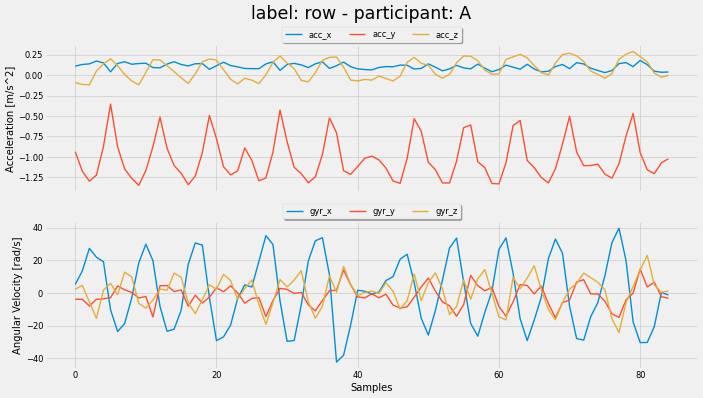

In [18]:
# --------------------------------------------------------------
# Combine plots in one figure
# --------------------------------------------------------------
label = "row"
participant = "A"

combine_plot_df = (
    df.query(f'label == "{label}"')
    .query(f'participant == "{participant}"')
    .reset_index(drop=True)
)

fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(15, 8))
combine_plot_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax[0])
combine_plot_df[["gyr_x", "gyr_y", "gyr_z"]].plot(ax=ax[1])

ax[0].legend(
    loc="upper center", bbox_to_anchor=(0.5, 1.15), ncol=3, fancybox=True, shadow=True
)
ax[1].legend(
    loc="upper center", bbox_to_anchor=(0.5, 1.15), ncol=3, fancybox=True, shadow=True
)

ax[1].set_xlabel("Samples")

ax[0].set_ylabel("Acceleration [m/s^2]")
ax[1].set_ylabel("Angular Velocity [rad/s]")

fig.suptitle(f"label: {label} - participant: {participant}")
plt.show()

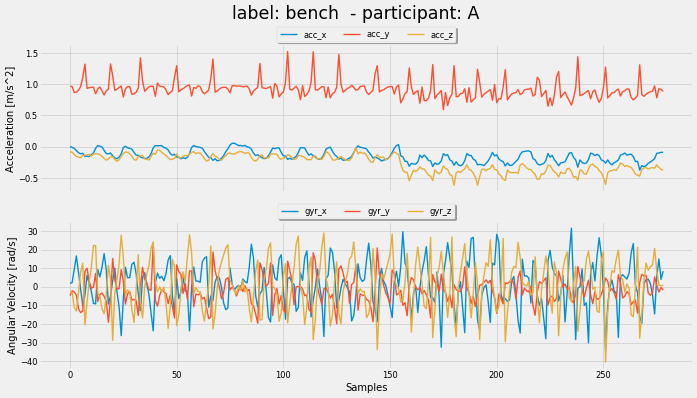

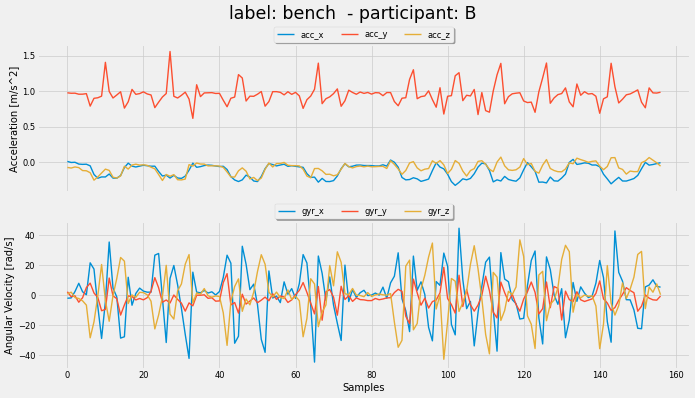

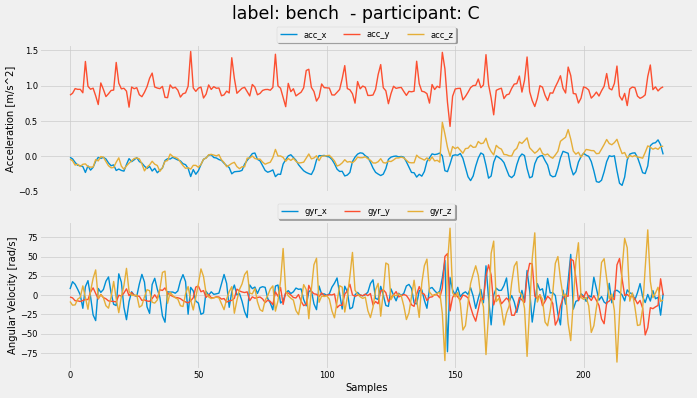

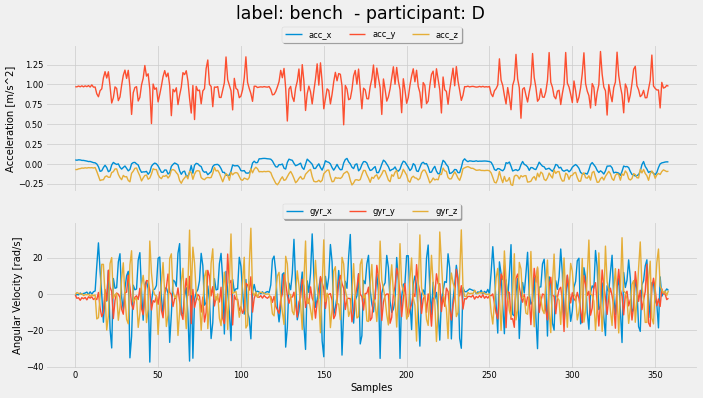

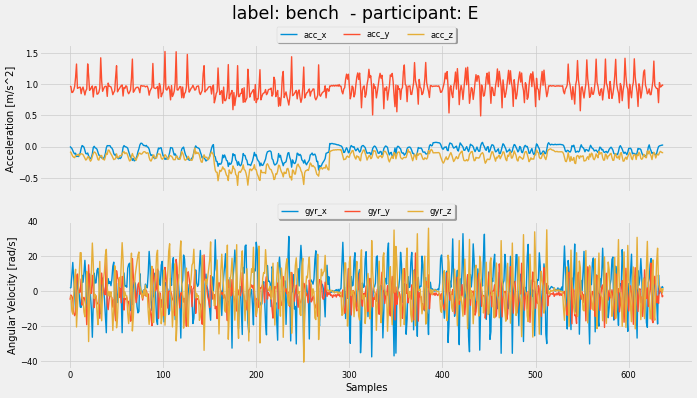

...

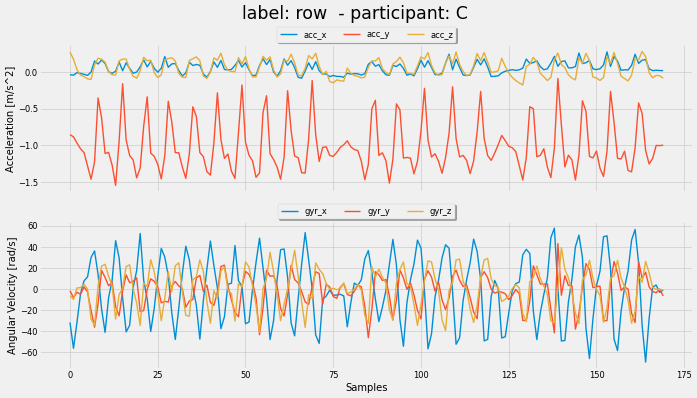

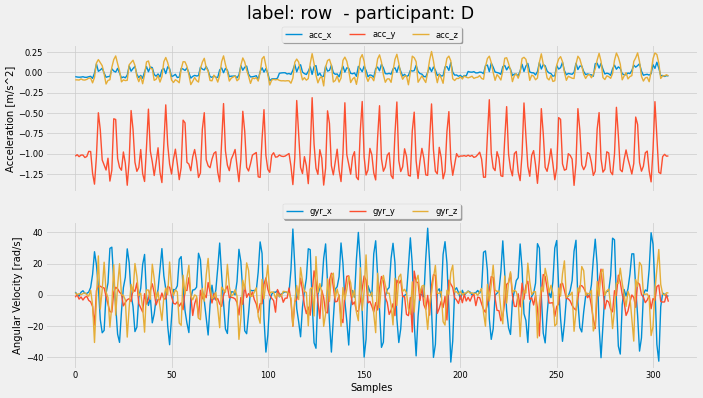

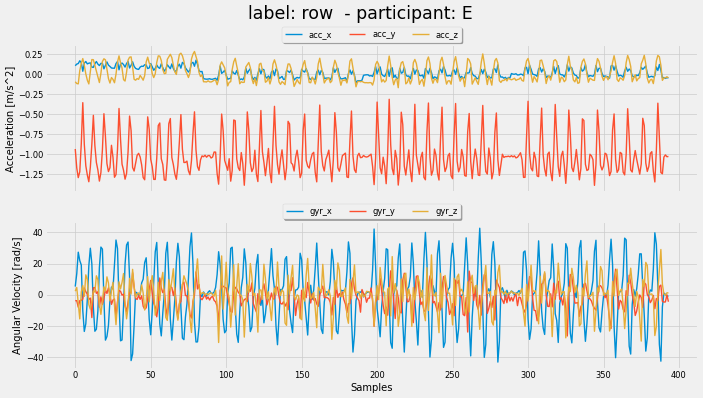

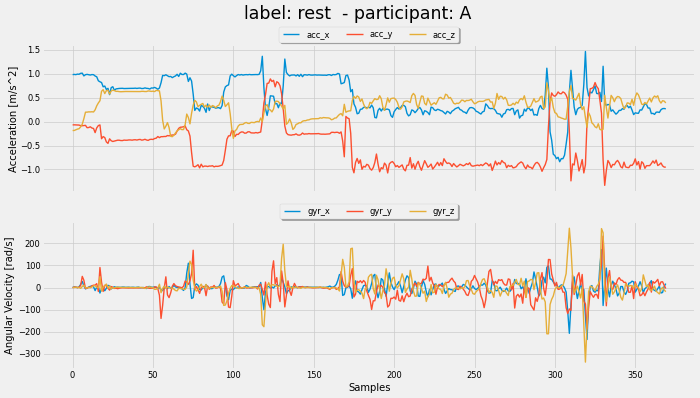

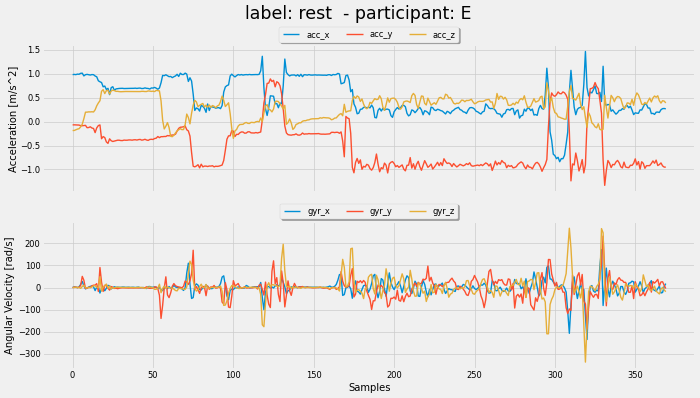

In [19]:
# --------------------------------------------------------------
# Loop over all combinations and export for both sensors
# --------------------------------------------------------------

labels = df["label"].unique()
participants = df["participant"].unique()
participants.sort()

for label in labels:
    for participant in participants:
        combine_plot_df = (
            df.query(f'label == "{label}"')
            .query(f'participant == "{participant}"')
            .reset_index(drop=True)
        )

        if len(combine_plot_df) > 0:

            fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(15, 8))
            combine_plot_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax[0])
            combine_plot_df[["gyr_x", "gyr_y", "gyr_z"]].plot(ax=ax[1])

            ax[0].legend(
                loc="upper center",
                bbox_to_anchor=(0.5, 1.15),
                ncol=3,
                fancybox=True,
                shadow=True,
            )
            ax[1].legend(
                loc="upper center",
                bbox_to_anchor=(0.5, 1.15),
                ncol=3,
                fancybox=True,
                shadow=True,
            )

            ax[1].set_xlabel("Samples")

            ax[0].set_ylabel("Acceleration [m/s^2]")
            ax[1].set_ylabel("Angular Velocity [rad/s]")

            fig.suptitle(f"label: {label}  - participant: {participant}")
            plt.show()